# No-Z Robust Gate: Gaussian Filter Verification

This notebook optimizes robust single-qubit gates using only X and Y controls (no Z),
then cross-verifies the results survive a 250 MHz Gaussian hardware filter using an
independent Schrödinger-equation simulation (QuantumToolbox.jl).

## 1. Imports

In [384]:
import Pkg; Pkg.activate(@__DIR__); Pkg.instantiate();
Pkg.develop(path="../../QuantumCollocation.jl")
using PiccoloQuantumObjects
using QuantumCollocation
using ForwardDiff
using LinearAlgebra
using SparseArrays
using Statistics
using CairoMakie
using Random
using NamedTrajectories

## 2. Problem Setup & Optimization

In [385]:
# Problem parameters
T = 100
Δt = 2.0
U_goal = GATES.H
H_drive = [PAULIS.X, PAULIS.Y]
piccolo_opts = PiccoloOptions(verbose=false)
sys = QuantumSystem(H_drive)
seed = 2
F = 0.9999
num_iter = 2000
hess = false
hess_iter = 100

# Control bounds (shared across all three problem types)
a_bound = 0.1 * 2 * π
da_bound = Inf
dda_bound = 1.0
Q = 25.0

25.0

In [386]:
# Default (no robustness)
Random.seed!(seed)
def = UnitarySmoothPulseProblem(sys, U_goal, T, Δt;
    Δt_max=Δt, Δt_min=Δt,
    a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound, Q_t=1.0)
push!(def.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, def.trajectory))
solve!(def, max_iter=num_iter, print_level=1, options=IpoptOptions(eval_hessian=false))
if hess
    solve!(def, max_iter=hess_iter, print_level=1)
end

In [387]:
# Toggling (Bikrant's method)
Random.seed!(seed)
∂ₑHₐ = [PAULIS.Z]
varsys_bik = VariationalQuantumSystem(H_drive, ∂ₑHₐ)
Random.seed!(seed)
add_prob = UnitaryToggleProblem(
    varsys_bik, U_goal, T, Δt;
    a_bound=a_bound,
    da_bound=da_bound,
    dda_bound=dda_bound,
    Δt_min=Δt,
    Δt_max=Δt,
    piccolo_options=piccolo_opts,
    Q=0.0,
    Q_t=Q
)
push!(add_prob.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, add_prob.trajectory))
solve!(add_prob, max_iter=num_iter, print_level=5, options=IpoptOptions(eval_hessian=false))
if hess
    solve!(add_prob, max_iter=hess_iter, print_level=5)
end

In [388]:
# Adjoint/Variational
Random.seed!(seed)
varsys_add = VariationalQuantumSystem(H_drive, [PAULIS.Z])
var_count = length(varsys_add.G_vars)

varadd_prob = UnitaryVariationalProblem(
    varsys_add, U_goal, T, Δt;
    robust_times = [[T] for _ in 1:var_count],
    Δt_min=Δt, Δt_max=Δt,
    a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound,
    Q=0.0, Q_r=Q, Q_s=0.0,
    piccolo_options=PiccoloOptions(verbose=false)
)

init_traj = deepcopy(varadd_prob.trajectory)
init_traj.Ũ⃗ .= unitary_rollout(init_traj, varsys_add)

varadd_prob = UnitaryVariationalProblem(
    varsys_add, U_goal, T, Δt;
    robust_times = [[T] for _ in 1:var_count],
    Δt_min=Δt, Δt_max=Δt,
    init_trajectory = remove_components(init_traj, [:Ũ⃗ᵥ1]),
    a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound,
    Q=0.0, Q_r=Q, Q_s=0.0,
    piccolo_options=PiccoloOptions(verbose=false)
)
push!(varadd_prob.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, varadd_prob.trajectory))
solve!(varadd_prob, max_iter=num_iter, print_level=5, options=IpoptOptions(eval_hessian=false))
if hess
    solve!(varadd_prob, max_iter=hess_iter, print_level=5)
end

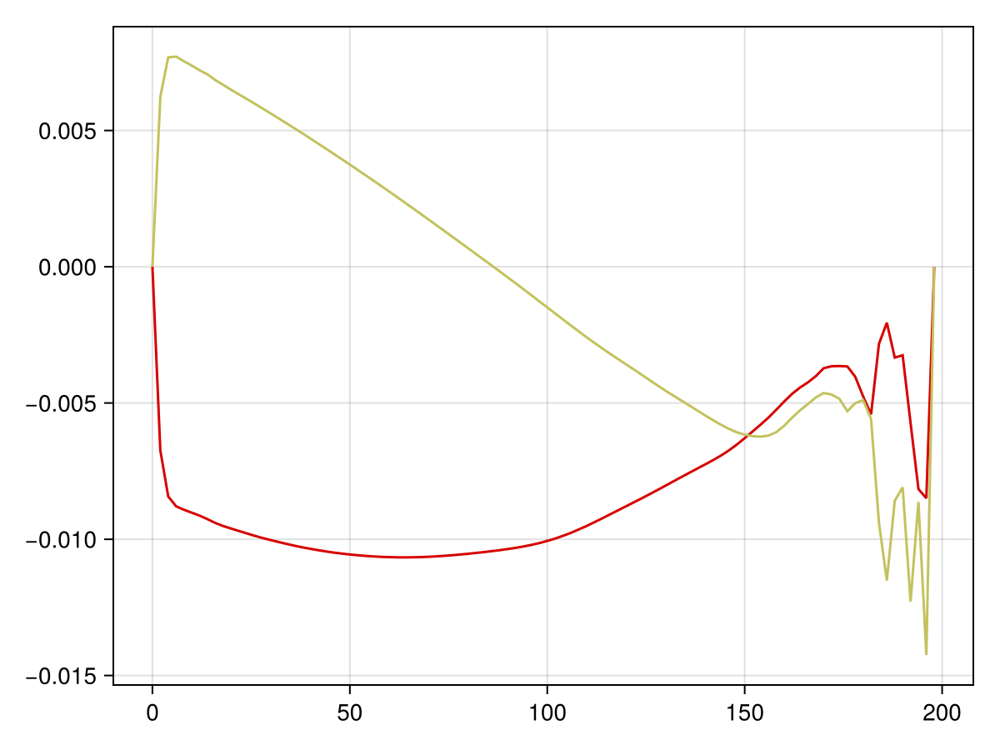

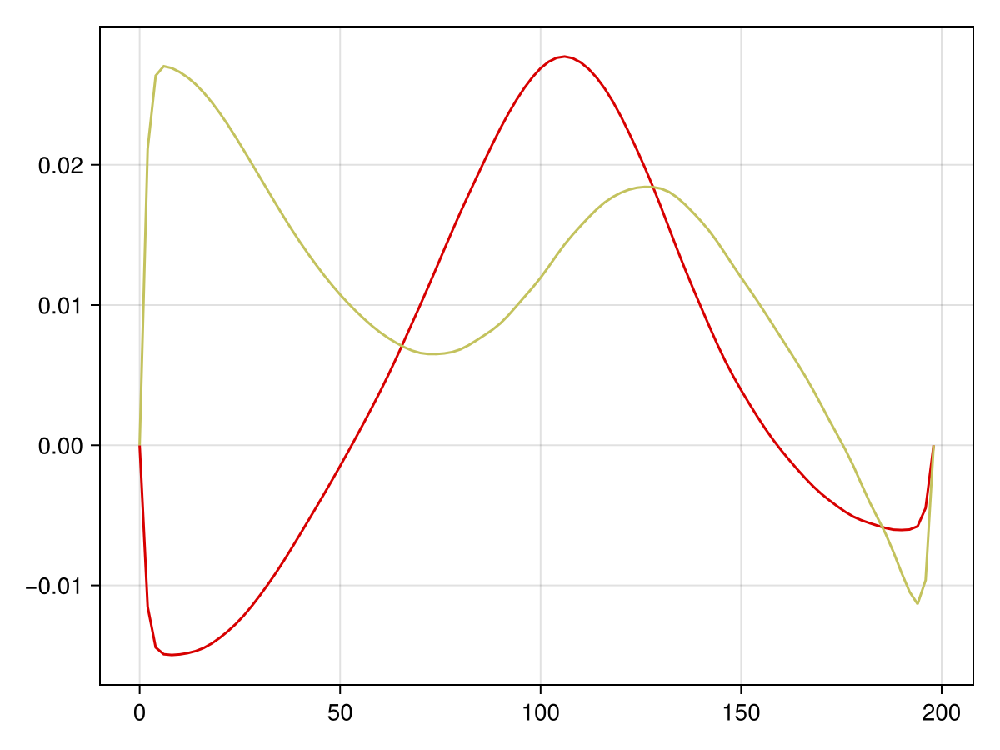

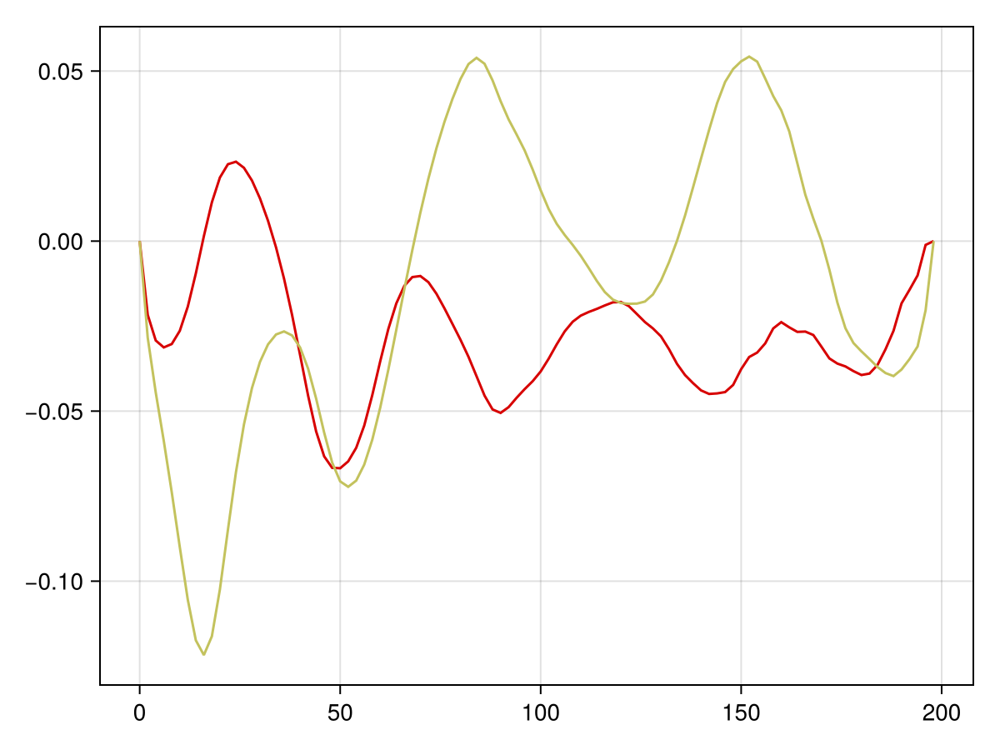

CairoMakie.Screen{IMAGE}


In [389]:
# Plot optimized controls
display(CairoMakie.plot(def.trajectory, :a))
display(CairoMakie.plot(add_prob.trajectory, :a))
display(CairoMakie.plot(varadd_prob.trajectory, :a))

## 3. Piccolo Rollout: Fidelity vs ε

Baseline verification using Piccolo's built-in `unitary_rollout_fidelity`.
This is the optimizer's own propagator — we will cross-check it below.

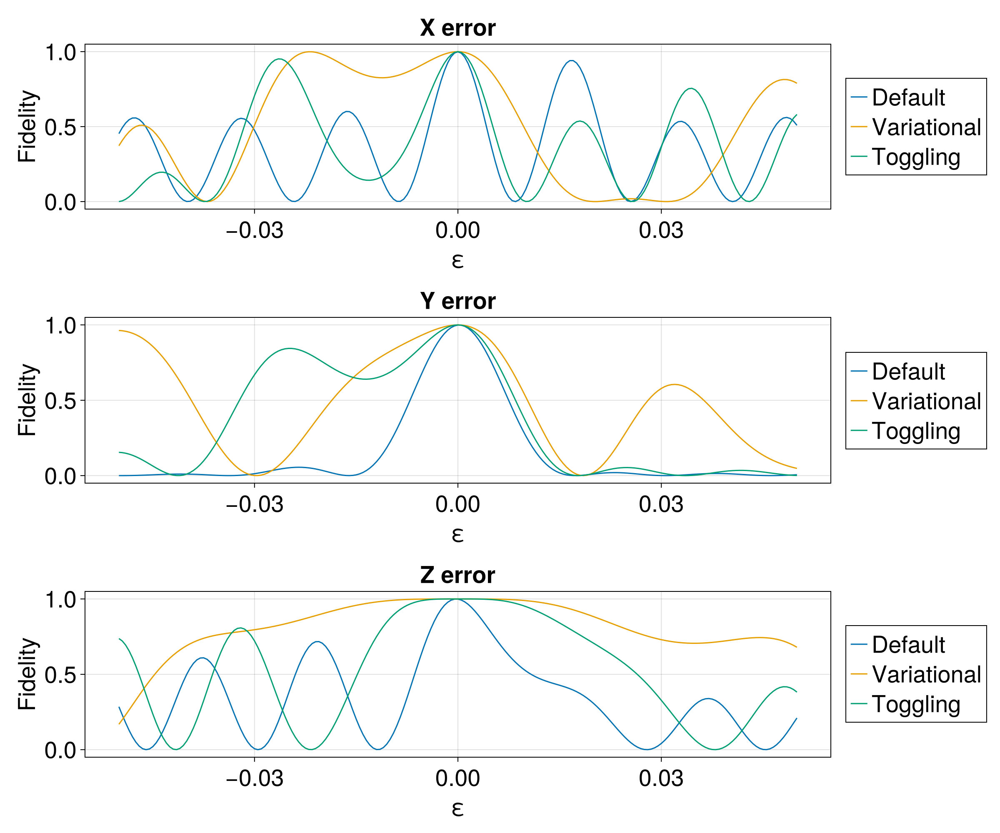

CairoMakie.Screen{IMAGE}


In [390]:
gen = [PAULIS.X, PAULIS.Y]
εs_piccolo = -0.05:0.0005:0.05

fidelity_curve(prob, pauli) =
    [unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * pauli, gen)) for ε in εs_piccolo]

problems = [
    (def,         "Default"),
    (varadd_prob, "Variational"),
    (add_prob,    "Toggling"),
]

f = Figure(fontsize=28, size=(1200, 1000))
axX = Axis(f[1, 1], title="X error", xlabel="ε", ylabel="Fidelity")
axY = Axis(f[2, 1], title="Y error", xlabel="ε", ylabel="Fidelity")
axZ = Axis(f[3, 1], title="Z error", xlabel="ε", ylabel="Fidelity")

colors = Makie.wong_colors()

for (ax, pauli) in [(axX, PAULIS.X), (axY, PAULIS.Y), (axZ, PAULIS.Z)]
    for (i, (prob, label)) in enumerate(problems)
        ys = norm.(fidelity_curve(prob, pauli))
        lines!(ax, collect(εs_piccolo), ys; label=label, color=colors[i])
    end
end

Legend(f[1, 2], axX)
Legend(f[2, 2], axY)
Legend(f[3, 2], axZ)
display(f)

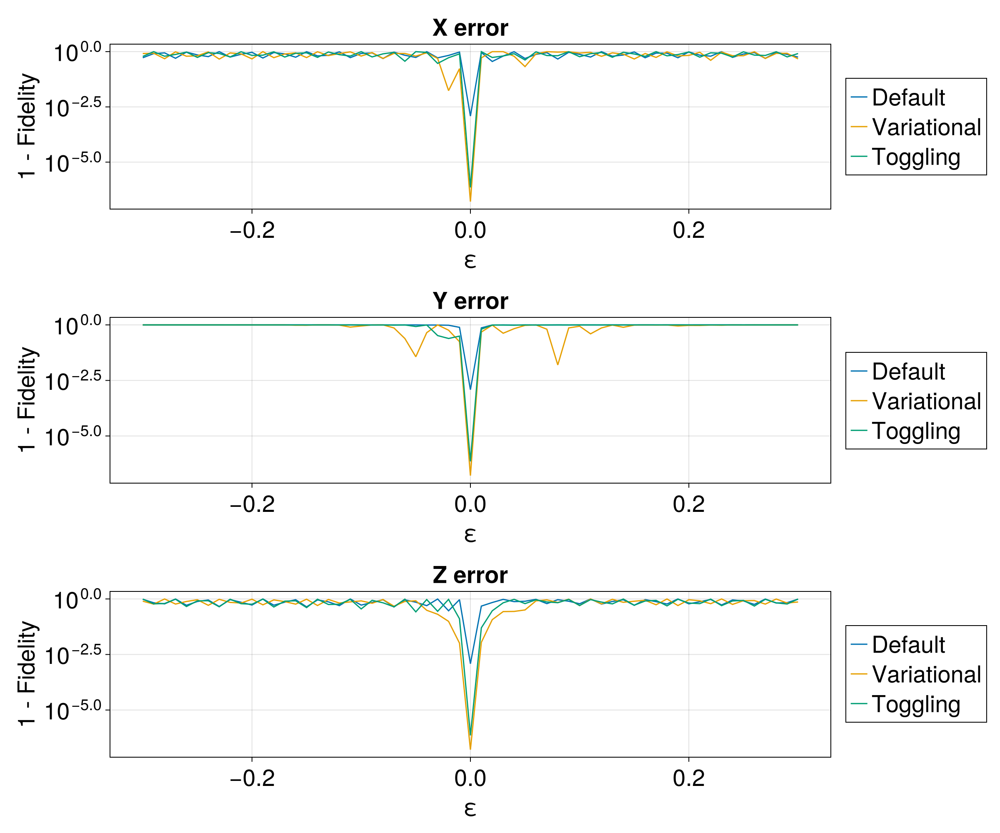

CairoMakie.Screen{IMAGE}


In [391]:
f = Figure(fontsize=28, size=(1200, 1000))
axX = Axis(f[1, 1], title="X error", xlabel="ε", ylabel="1 - Fidelity", yscale=log10)
axY = Axis(f[2, 1], title="Y error", xlabel="ε", ylabel="1 - Fidelity", yscale=log10)
axZ = Axis(f[3, 1], title="Z error", xlabel="ε", ylabel="1 - Fidelity", yscale=log10)

εs_log = -0.3:0.01:0.3

for (ax, pauli) in [(axX, PAULIS.X), (axY, PAULIS.Y), (axZ, PAULIS.Z)]
    for (i, (prob, label)) in enumerate(problems)
        ys = norm.([unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * pauli, gen)) for ε in εs_log] .- 1)
        lines!(ax, collect(εs_log), ys; label=label, color=colors[i])
    end
end

Legend(f[1, 2], axX)
Legend(f[2, 2], axY)
Legend(f[3, 2], axZ)
display(f)

## 4. Gaussian Filter (250 MHz)

Apply a Gaussian low-pass filter (−3 dB at 250 MHz) to the optimized controls.
This models the hardware bandwidth limitation: the AWG output is smoothed
before reaching the qubit.

In [392]:
using FFTW

"""
FFT frequency axis (Hz) for length N and timestep dt_s (seconds).
"""
function flt_fftfreq(N::Int, dt_s::Float64)
    df = 1.0 / (N * dt_s)
    freqs = [k <= N ÷ 2 ? k : k - N for k in 0:N-1]
    return df .* freqs
end

"""
Gaussian amplitude response: |G(f)| = exp(−f²/(2σ_f²)),
σ_f = B3dB / √(ln2), giving −3 dB in power at B3dB.
"""
function flt_gaussian_response(freqs::AbstractVector{<:Real}, B3dB_Hz::Float64)
    σf = B3dB_Hz / sqrt(log(2.0))
    return @. exp(-0.5 * (freqs^2) / σf^2)
end

"""
    apply_gaussian_filter(u_x, u_y; dt_ns, M=20, B3dB_Hz=250e6)

ZOH-upsample by factor M, apply Gaussian filter in frequency domain.
Returns (u_x_filt, u_y_filt, dt_fine_ns).
"""
function apply_gaussian_filter(u_x_coarse::AbstractVector,
                               u_y_coarse::AbstractVector;
                               dt_ns::Real,
                               M::Int=20,
                               B3dB_Hz::Real=250e6)
    @assert length(u_x_coarse) == length(u_y_coarse)

    dt_coarse_s = Float64(dt_ns) * 1e-9
    dt_fine_s   = dt_coarse_s / M
    dt_fine_ns  = Float64(dt_ns) / M

    u_x_zoh = repeat(u_x_coarse, inner=(M,))
    u_y_zoh = repeat(u_y_coarse, inner=(M,))
    u_zoh   = u_x_zoh .+ 1im .* u_y_zoh

    N_fine = length(u_x_zoh)
    freqs  = flt_fftfreq(N_fine, dt_fine_s)
    G      = flt_gaussian_response(freqs, Float64(B3dB_Hz))

    U_filt = G .* fft(u_zoh)
    u_out  = ifft(U_filt)

    return real.(u_out), imag.(u_out), dt_fine_ns
end

apply_gaussian_filter

In [393]:
M_upsample = 20
B3dB = 250e6

# Extract coarse controls
u_x_add_coarse = add_prob.trajectory.a[1, :]
u_y_add_coarse = add_prob.trajectory.a[2, :]
Δt_add_ns = Float64(add_prob.trajectory.Δt[1])

u_x_var_coarse = varadd_prob.trajectory.a[1, :]
u_y_var_coarse = varadd_prob.trajectory.a[2, :]
Δt_var_ns = Float64(varadd_prob.trajectory.Δt[1])

u_x_def_coarse = def.trajectory.a[1, :]
u_y_def_coarse = def.trajectory.a[2, :]
Δt_def_ns = Float64(def.trajectory.Δt[1])

# Apply Gaussian filter to all three
u_x_add_filt, u_y_add_filt, Δt_add_fine =
    apply_gaussian_filter(u_x_add_coarse, u_y_add_coarse; dt_ns=Δt_add_ns, M=M_upsample, B3dB_Hz=B3dB)

u_x_var_filt, u_y_var_filt, Δt_var_fine =
    apply_gaussian_filter(u_x_var_coarse, u_y_var_coarse; dt_ns=Δt_var_ns, M=M_upsample, B3dB_Hz=B3dB)

u_x_def_filt, u_y_def_filt, Δt_def_fine =
    apply_gaussian_filter(u_x_def_coarse, u_y_def_coarse; dt_ns=Δt_def_ns, M=M_upsample, B3dB_Hz=B3dB)

println("Filter applied. Fine timestep: $(Δt_add_fine) ns")
println("Coarse points: $(length(u_x_add_coarse)), Fine points: $(length(u_x_add_filt))")

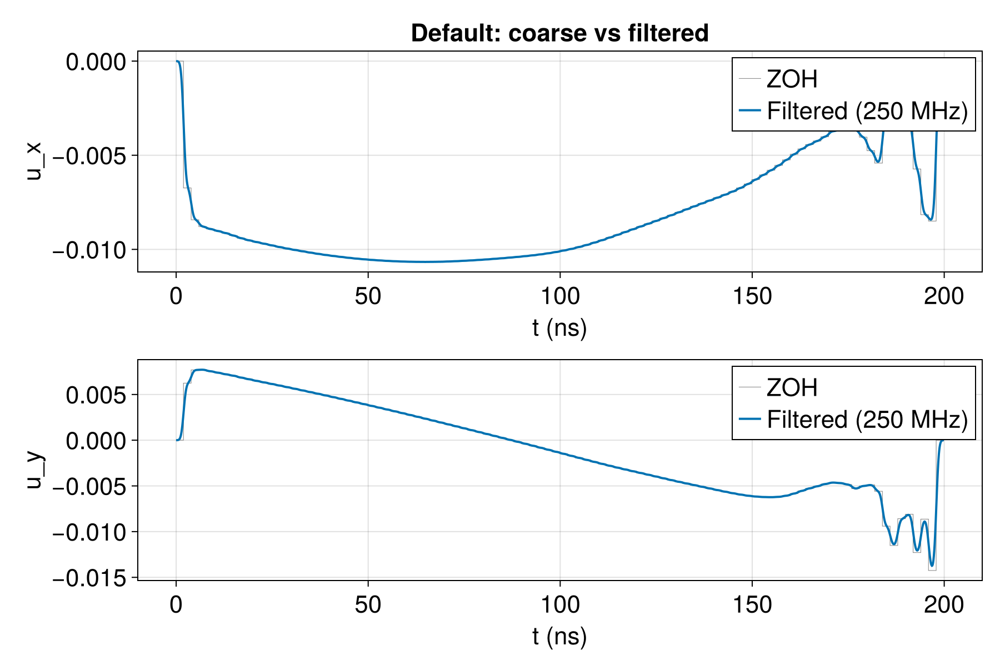

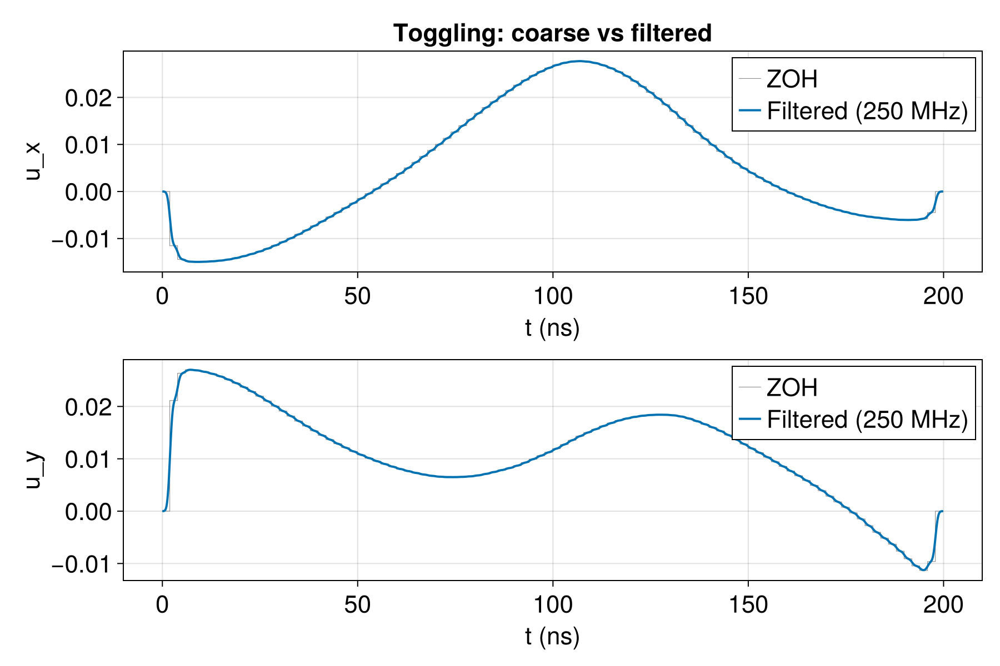

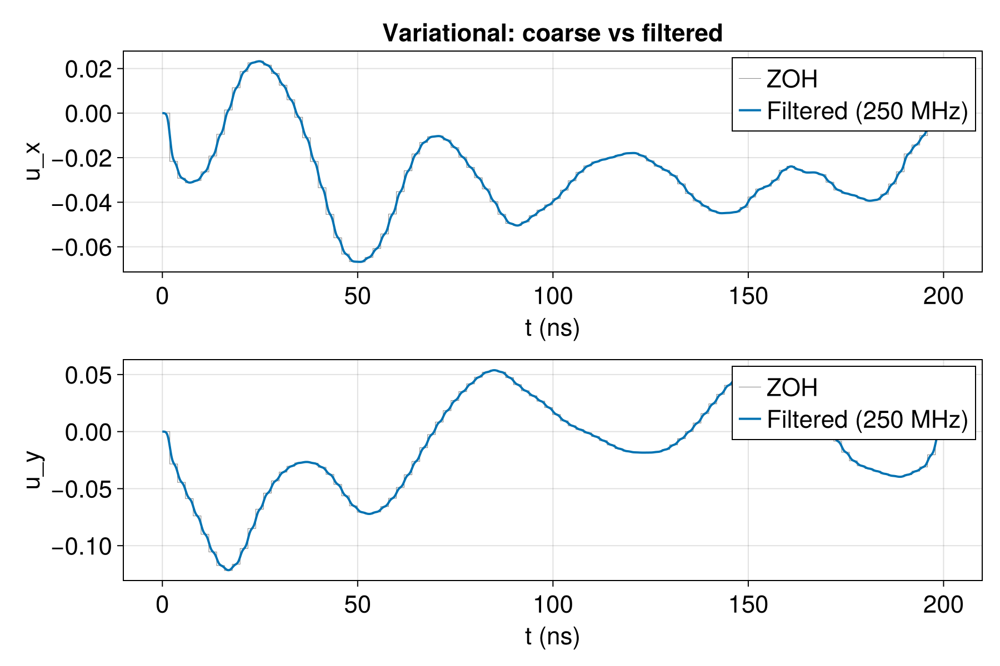

In [394]:
# Plot filtered vs coarse controls for each method
CairoMakie.activate!()

for (label, ux_c, uy_c, ux_f, uy_f, dt_c, dt_f) in [
    ("Default",      u_x_def_coarse, u_y_def_coarse, u_x_def_filt, u_y_def_filt, Δt_def_ns, Δt_def_fine),
    ("Toggling",     u_x_add_coarse, u_y_add_coarse, u_x_add_filt, u_y_add_filt, Δt_add_ns, Δt_add_fine),
    ("Variational",  u_x_var_coarse, u_y_var_coarse, u_x_var_filt, u_y_var_filt, Δt_var_ns, Δt_var_fine),
]
    Nc = length(ux_c)
    Nf = length(ux_f)
    t_c = (0:Nc-1) .* dt_c
    t_f = (0:Nf-1) .* dt_f

    fig = Figure(resolution=(900, 600), fontsize=22)
    ax1 = Axis(fig[1, 1], xlabel="t (ns)", ylabel="u_x", title="$label: coarse vs filtered")
    stairs!(ax1, t_f, repeat(ux_c, inner=(M_upsample,)), label="ZOH", color=:gray, linewidth=0.5)
    lines!(ax1, t_f, ux_f, label="Filtered (250 MHz)", linewidth=2)
    axislegend(ax1, position=:rt)

    ax2 = Axis(fig[2, 1], xlabel="t (ns)", ylabel="u_y")
    stairs!(ax2, t_f, repeat(uy_c, inner=(M_upsample,)), label="ZOH", color=:gray, linewidth=0.5)
    lines!(ax2, t_f, uy_f, label="Filtered (250 MHz)", linewidth=2)
    axislegend(ax2, position=:rt)

    display(fig)
end

## 5. Independent Simulation (QuantumToolbox)

Cross-verify the gate fidelity using an independent ODE-based Schrödinger equation
solver from QuantumToolbox.jl. This is a completely separate propagation from
Piccolo's piecewise-constant rollout.

We simulate both:
1. **Unfiltered** controls (ZOH on coarse grid) — should match Piccolo rollout
2. **Filtered** controls (after Gaussian filter on fine grid) — the physically realistic scenario

In [395]:
using QuantumToolbox

const QT = QuantumToolbox

"""
    qt_simulate_fidelity(u_x, u_y, dt_ns, ε, U_goal_mat)

Independently simulate the unitary evolution under

    H(t) = u_x(t) σ_x + u_y(t) σ_y + ε σ_z

using QuantumToolbox's Schrödinger equation solver (ODE-based).
Returns the gate fidelity F = |Tr(U_goal† U(T))| / 2.

Controls are piecewise-constant (ZOH) on the given timestep grid.
"""
function qt_simulate_fidelity(u_x::AbstractVector,
                              u_y::AbstractVector,
                              dt_ns::Real,
                              ε::Real,
                              U_goal_q::QT.QuantumObject)
    N = length(u_x)
    @assert length(u_y) == N

    dt_f = Float64(dt_ns)
    T_ns = (N - 1) * dt_f
    tlist = collect(0.0:dt_f:T_ns)

    sx = QT.sigmax()
    sy = QT.sigmay()
    sz = QT.sigmaz()

    function ux_coef(p, t)
        idx = Int(floor(clamp(t, 0.0, T_ns) / dt_f)) + 1
        return u_x[idx]
    end

    function uy_coef(p, t)
        idx = Int(floor(clamp(t, 0.0, T_ns) / dt_f)) + 1
        return u_y[idx]
    end

    uz_coef(p, t) = ε

    H_t = QT.QobjEvo((
        (sx, ux_coef),
        (sy, uy_coef),
        (sz, uz_coef),
    ))

    # Evolve |0⟩ and |1⟩ to build U(T)
    ψ0 = QT.basis(2, 0)
    ψ1 = QT.basis(2, 1)

    sol0 = QT.sesolve(H_t, ψ0, tlist; progress_bar=Val(false))
    sol1 = QT.sesolve(H_t, ψ1, tlist; progress_bar=Val(false))

    U_mat = hcat(sol0.states[end].data, sol1.states[end].data)
    U_T   = QT.QuantumObject(U_mat)

    return abs(tr(U_goal_q' * U_T)) / 2
end

qt_simulate_fidelity

### 5a. Cross-check at ε = 0: Piccolo vs QT (unfiltered)

First sanity check: at zero error, both Piccolo's rollout and the independent
QT simulation should agree on the fidelity to the Hadamard gate.

In [396]:
U_goal_q = QT.QuantumObject(GATES.H)

# Piccolo rollout fidelities at ε = 0
F_def_piccolo = unitary_rollout_fidelity(def.trajectory, QuantumSystem(0.0 * PAULIS.Z, gen))
F_add_piccolo = unitary_rollout_fidelity(add_prob.trajectory, QuantumSystem(0.0 * PAULIS.Z, gen))
F_var_piccolo = unitary_rollout_fidelity(varadd_prob.trajectory, QuantumSystem(0.0 * PAULIS.Z, gen))

# QT simulation fidelities at ε = 0 (unfiltered, coarse grid)
F_def_qt = qt_simulate_fidelity(u_x_def_coarse, u_y_def_coarse, Δt_def_ns, 0.0, U_goal_q)
F_add_qt = qt_simulate_fidelity(u_x_add_coarse, u_y_add_coarse, Δt_add_ns, 0.0, U_goal_q)
F_var_qt = qt_simulate_fidelity(u_x_var_coarse, u_y_var_coarse, Δt_var_ns, 0.0, U_goal_q)

# QT simulation fidelities at ε = 0 (FILTERED, fine grid)
F_def_qt_filt = qt_simulate_fidelity(u_x_def_filt, u_y_def_filt, Δt_def_fine, 0.0, U_goal_q)
F_add_qt_filt = qt_simulate_fidelity(u_x_add_filt, u_y_add_filt, Δt_add_fine, 0.0, U_goal_q)
F_var_qt_filt = qt_simulate_fidelity(u_x_var_filt, u_y_var_filt, Δt_var_fine, 0.0, U_goal_q)

println("=== Fidelity at ε = 0 ===")
println()
println("                  Piccolo rollout    QT (unfiltered)    QT (filtered)")
println("Default:          $(round(F_def_piccolo, digits=8))     $(round(F_def_qt, digits=8))     $(round(F_def_qt_filt, digits=8))")
println("Toggling:         $(round(F_add_piccolo, digits=8))     $(round(F_add_qt, digits=8))     $(round(F_add_qt_filt, digits=8))")
println("Variational:      $(round(F_var_piccolo, digits=8))     $(round(F_var_qt, digits=8))     $(round(F_var_qt_filt, digits=8))")
println()
println("If Piccolo ≈ QT (unfiltered), the propagators agree.")
println("If QT (filtered) is close to QT (unfiltered), the gate survives the filter.")

### 5b. Fidelity vs ε sweep: Unfiltered (Piccolo vs QT)

Sweep over Z-error strengths. The Piccolo rollout and QT simulation should
produce nearly identical curves for the unfiltered (ZOH) controls.

In [397]:
εs = collect(-0.1:0.002:0.1)

# Piccolo rollout
F_def_p = [unitary_rollout_fidelity(def.trajectory, QuantumSystem(ε * PAULIS.Z, gen)) for ε in εs]
F_add_p = [unitary_rollout_fidelity(add_prob.trajectory, QuantumSystem(ε * PAULIS.Z, gen)) for ε in εs]
F_var_p = [unitary_rollout_fidelity(varadd_prob.trajectory, QuantumSystem(ε * PAULIS.Z, gen)) for ε in εs]

# QT simulation (unfiltered, coarse timestep)
F_def_qt_unfilt = [qt_simulate_fidelity(u_x_def_coarse, u_y_def_coarse, Δt_def_ns, ε, U_goal_q) for ε in εs]
F_add_qt_unfilt = [qt_simulate_fidelity(u_x_add_coarse, u_y_add_coarse, Δt_add_ns, ε, U_goal_q) for ε in εs]
F_var_qt_unfilt = [qt_simulate_fidelity(u_x_var_coarse, u_y_var_coarse, Δt_var_ns, ε, U_goal_q) for ε in εs]

println("Unfiltered sweep complete.")

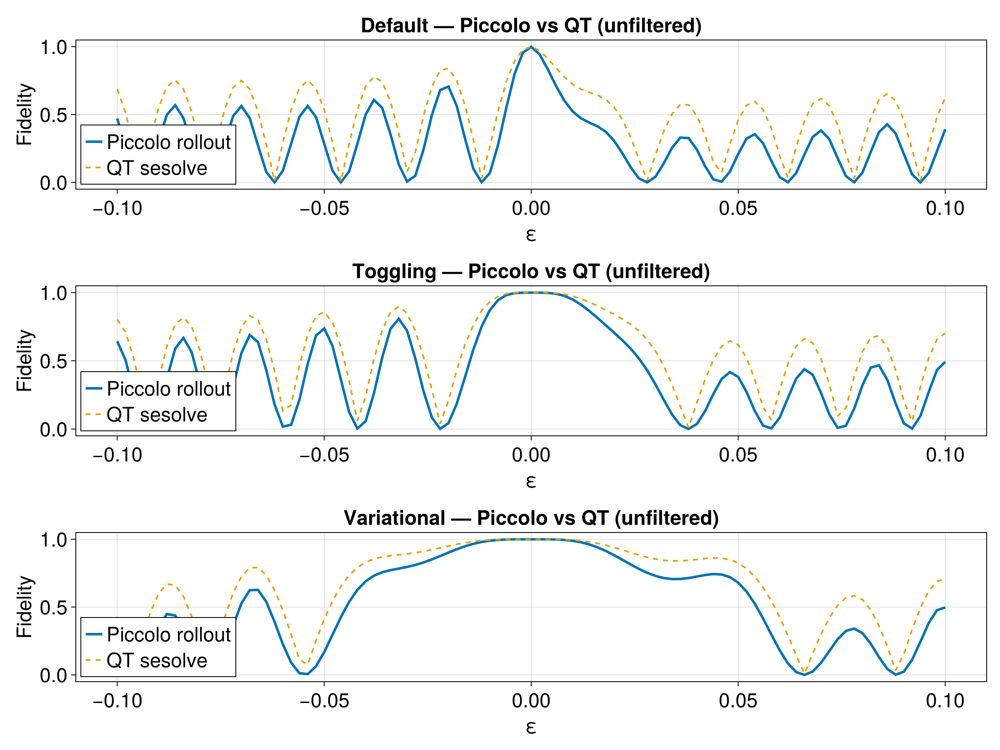

CairoMakie.Screen{IMAGE}


In [398]:
fig = Figure(fontsize=24, size=(1200, 900))

ax1 = Axis(fig[1, 1], title="Default — Piccolo vs QT (unfiltered)",
    xlabel="ε", ylabel="Fidelity")
lines!(ax1, εs, norm.(F_def_p), label="Piccolo rollout", linewidth=3)
lines!(ax1, εs, F_def_qt_unfilt, label="QT sesolve", linewidth=2, linestyle=:dash)
axislegend(ax1, position=:lb)

ax2 = Axis(fig[2, 1], title="Toggling — Piccolo vs QT (unfiltered)",
    xlabel="ε", ylabel="Fidelity")
lines!(ax2, εs, norm.(F_add_p), label="Piccolo rollout", linewidth=3)
lines!(ax2, εs, F_add_qt_unfilt, label="QT sesolve", linewidth=2, linestyle=:dash)
axislegend(ax2, position=:lb)

ax3 = Axis(fig[3, 1], title="Variational — Piccolo vs QT (unfiltered)",
    xlabel="ε", ylabel="Fidelity")
lines!(ax3, εs, norm.(F_var_p), label="Piccolo rollout", linewidth=3)
lines!(ax3, εs, F_var_qt_unfilt, label="QT sesolve", linewidth=2, linestyle=:dash)
axislegend(ax3, position=:lb)

display(fig)

### 5c. Fidelity vs ε sweep: Filtered controls

This is the key result: does the gate fidelity and robustness survive
the 250 MHz Gaussian hardware filter? We simulate the filtered waveforms
with the independent QT solver.

In [399]:
# QT simulation (filtered, fine timestep)
F_def_qt_filt_sweep = [qt_simulate_fidelity(u_x_def_filt, u_y_def_filt, Δt_def_fine, ε, U_goal_q) for ε in εs]
F_add_qt_filt_sweep = [qt_simulate_fidelity(u_x_add_filt, u_y_add_filt, Δt_add_fine, ε, U_goal_q) for ε in εs]
F_var_qt_filt_sweep = [qt_simulate_fidelity(u_x_var_filt, u_y_var_filt, Δt_var_fine, ε, U_goal_q) for ε in εs]

println("Filtered sweep complete.")

## 6. Cross-Verification: All Curves Together

Three propagation methods on one plot for each gate type:
- **Piccolo rollout** (optimizer's own propagator, unfiltered)
- **QT unfiltered** (independent ODE solver, same ZOH controls)
- **QT filtered** (independent ODE solver, after 250 MHz Gaussian)

Agreement between Piccolo and QT-unfiltered validates the propagation.
The QT-filtered curve shows the physically realistic gate performance.

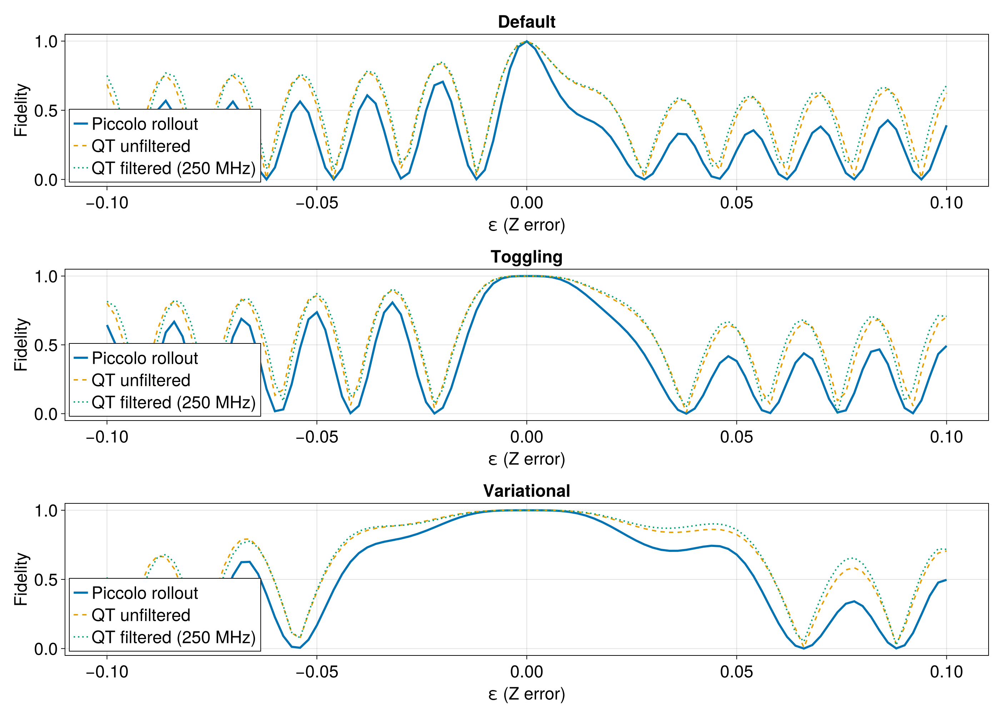

CairoMakie.Screen{IMAGE}


In [400]:
fig = Figure(fontsize=24, size=(1400, 1000))
colors = Makie.wong_colors()

for (row, label, F_p, F_qt_u, F_qt_f) in [
    (1, "Default",      F_def_p,  F_def_qt_unfilt,  F_def_qt_filt_sweep),
    (2, "Toggling",     F_add_p,  F_add_qt_unfilt,  F_add_qt_filt_sweep),
    (3, "Variational",  F_var_p,  F_var_qt_unfilt,  F_var_qt_filt_sweep),
]
    ax = Axis(fig[row, 1], title=label, xlabel="ε (Z error)", ylabel="Fidelity")

    lines!(ax, εs, norm.(F_p),
        label="Piccolo rollout", color=colors[1], linewidth=3)
    lines!(ax, εs, F_qt_u,
        label="QT unfiltered", color=colors[2], linewidth=2, linestyle=:dash)
    lines!(ax, εs, F_qt_f,
        label="QT filtered (250 MHz)", color=colors[3], linewidth=2, linestyle=:dot)

    axislegend(ax, position=:lb)
end

display(fig)

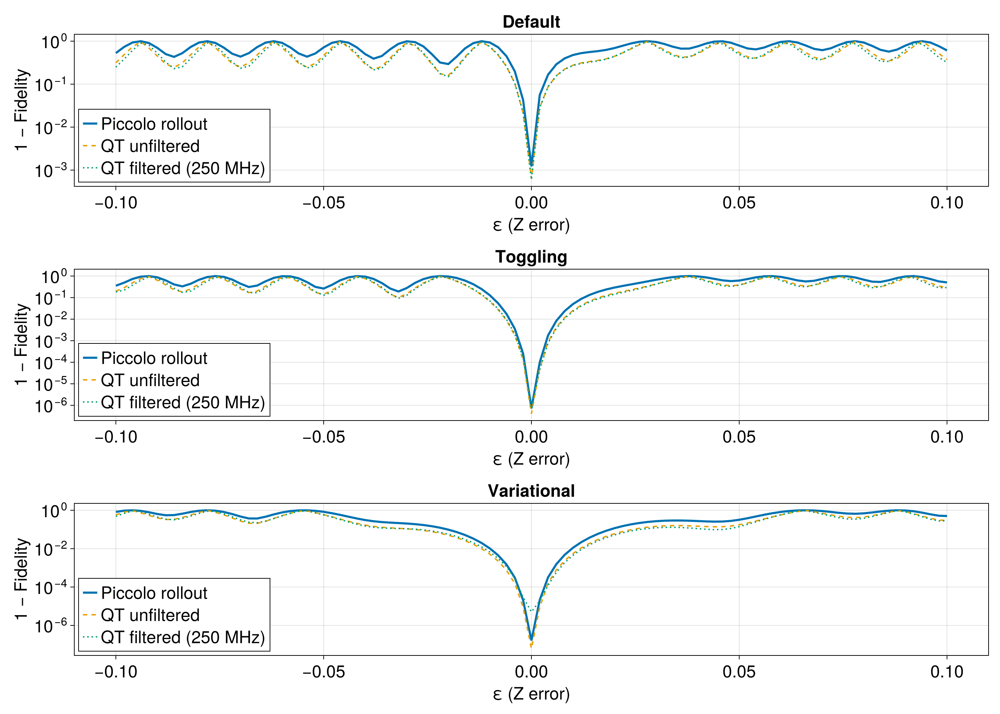

CairoMakie.Screen{IMAGE}


In [401]:
fig = Figure(fontsize=24, size=(1400, 1000))

for (row, label, F_p, F_qt_u, F_qt_f) in [
    (1, "Default",      F_def_p,  F_def_qt_unfilt,  F_def_qt_filt_sweep),
    (2, "Toggling",     F_add_p,  F_add_qt_unfilt,  F_add_qt_filt_sweep),
    (3, "Variational",  F_var_p,  F_var_qt_unfilt,  F_var_qt_filt_sweep),
]
    ax = Axis(fig[row, 1], title=label,
        xlabel="ε (Z error)", ylabel="1 − Fidelity", yscale=log10)

    lines!(ax, εs, norm.(F_p .- 1),
        label="Piccolo rollout", color=colors[1], linewidth=3)
    lines!(ax, εs, 1 .- F_qt_u,
        label="QT unfiltered", color=colors[2], linewidth=2, linestyle=:dash)
    lines!(ax, εs, 1 .- F_qt_f,
        label="QT filtered (250 MHz)", color=colors[3], linewidth=2, linestyle=:dot)

    axislegend(ax, position=:lb)
end

display(fig)

## 7. Filter Frequency Response

Visualize the Gaussian filter shape in frequency domain to confirm
the −3 dB point is at 250 MHz.

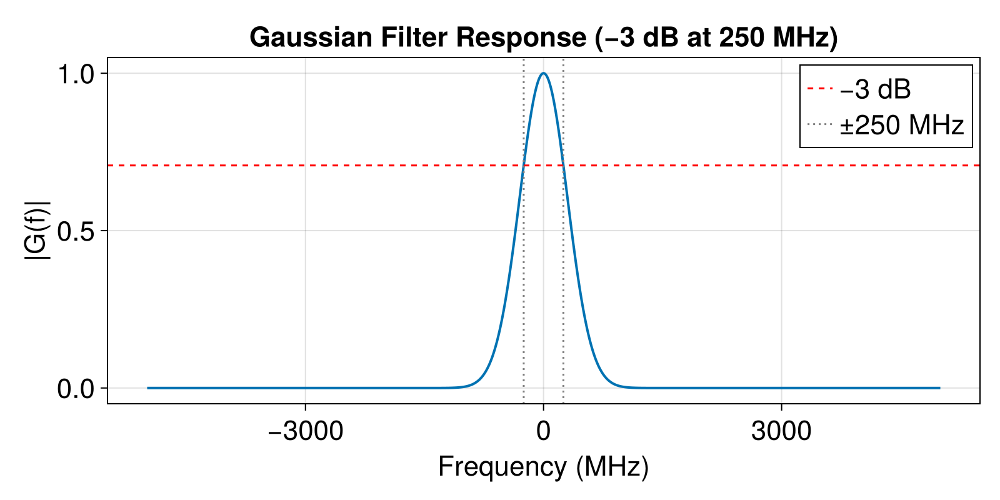

CairoMakie.Screen{IMAGE}


In [402]:
N_plot = length(u_x_add_filt)
dt_fine_s = Δt_add_fine * 1e-9
freqs = flt_fftfreq(N_plot, dt_fine_s)
G = flt_gaussian_response(freqs, Float64(B3dB))

# Sort for plotting
perm = sortperm(freqs)
freqs_sorted = freqs[perm] ./ 1e6  # MHz
G_sorted = G[perm]

fig = Figure(fontsize=22, size=(800, 400))
ax = Axis(fig[1, 1], xlabel="Frequency (MHz)", ylabel="|G(f)|",
    title="Gaussian Filter Response (−3 dB at 250 MHz)")
lines!(ax, freqs_sorted, G_sorted, linewidth=2)
hlines!(ax, [1/sqrt(2)], color=:red, linestyle=:dash, label="−3 dB")
vlines!(ax, [250, -250], color=:gray, linestyle=:dot, label="±250 MHz")
axislegend(ax)
display(fig)

## 9. Robustness Metrics: Variational & Toggling Objectives

Compute the variational (adjoint) and toggling-frame robustness metrics
for all three methods, plus the upsampled toggling objective. Displayed as bar charts.

In [403]:
function var_obj(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_errors::Vector{Matrix{ComplexF64}}
)
    Δt = traj.Δt[1]
    T = traj.T
    varsys = VariationalQuantumSystem(H_drives, H_errors)
    Ũ⃗, ∂Ũ⃗ = variational_unitary_rollout(traj, varsys)

    U = iso_vec_to_operator(Ũ⃗[:, end])
    ∂U = iso_vec_to_operator(∂Ũ⃗[1][:, end])

    d = size(U, 1)
    return abs(tr((U'*∂U)'*(U'*∂U))) / (T * Δt)^2 / d
end

function tog_obj(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_error::Matrix{ComplexF64}
)
    T = traj.T
    Δt = get_timesteps(traj)

    sys = QuantumSystem(H_drives)
    U = iso_vec_to_operator.(eachcol(unitary_rollout(traj, sys)))

    H_ti = sum(Δt[i] .* U[i]' * H_error * U[i] for i=1:T-1)

    d₁ = size(U[1], 1)
    Δt₁ = Δt[1]
    metric = norm(tr(H_ti'H_ti)) / (T * Δt₁)^2 / d₁
    return metric
end

function upsample_constant_controls(vals::AbstractArray; factor::Int=2)
    return repeat(vals, inner=factor)
end

function upsample_matrix(controls::AbstractArray, dts::AbstractArray; factor::Int=2)
    new_controls = []
    for c in eachrow(controls)
        push!(new_controls, upsample_constant_controls(c; factor=factor))
    end
    T = length(controls[1,:])
    dts_up = dts[1] / factor .* ones(length(dts) * factor * T)
    new_controls = reduce(vcat, [v' for v in new_controls])
    return new_controls, dts_up
end

function tog_obj_upsample(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_error::Matrix{ComplexF64};
    factor::Int=1
)
    T = traj.T * factor
    a_new, Δt_new = upsample_matrix(traj.a, traj.Δt; factor=factor)

    sys = QuantumSystem(H_drives)
    U = iso_vec_to_operator.(eachcol(unitary_rollout(a_new, Δt_new, sys)))

    H_ti = sum(Δt_new[i] .* U[i]' * H_error * U[i] for i = 1:(traj.T - 1) * factor)

    d₁ = size(U[1], 1)
    Δt₁ = Δt_new[1]
    metric = norm(tr(H_ti'H_ti)) / (T * Δt₁)^2 / d₁
    return metric
end

tog_obj_upsample (generic function with 1 method)

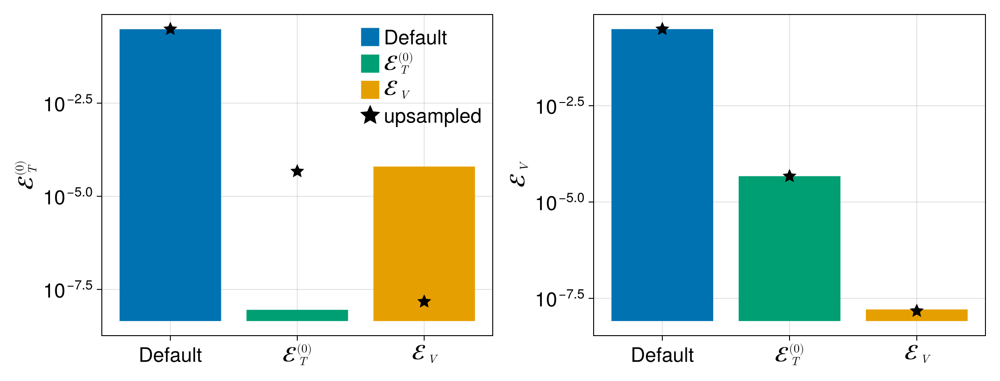

CairoMakie.Screen{IMAGE}


In [404]:
using LaTeXStrings

H_err = PAULIS.Z
upsample_factor = 2^10

# Compute metrics for all three methods
var_vals = Float64[
    var_obj(def.trajectory,        H_drive, [H_err]),
    var_obj(add_prob.trajectory,   H_drive, [H_err]),
    var_obj(varadd_prob.trajectory, H_drive, [H_err]),
]

tog_vals = Float64[
    tog_obj(def.trajectory,        H_drive, H_err),
    tog_obj(add_prob.trajectory,   H_drive, H_err),
    tog_obj(varadd_prob.trajectory, H_drive, H_err),
]

tog_vals_up = Float64[
    tog_obj_upsample(def.trajectory,        H_drive, H_err; factor=upsample_factor),
    tog_obj_upsample(add_prob.trajectory,   H_drive, H_err; factor=upsample_factor),
    tog_obj_upsample(varadd_prob.trajectory, H_drive, H_err; factor=upsample_factor),
]

println("=== Robustness Metrics ===")
println("                  var_obj          tog_obj          tog_obj (upsampled)")
println("Default:          $(var_vals[1])   $(tog_vals[1])   $(tog_vals_up[1])")
println("Toggling:         $(var_vals[2])   $(tog_vals[2])   $(tog_vals_up[2])")
println("Variational:      $(var_vals[3])   $(tog_vals[3])   $(tog_vals_up[3])")

# Bar charts
colors = [Makie.wong_colors()[1], Makie.wong_colors()[3], Makie.wong_colors()[2]]
xtick_labels = ["Default", L"\mathcal{E}_T^{(0)}", L"\mathcal{E}_V"]

f = Figure(size=(1100, 420), fontsize=22)

ax_tog = Axis(f[1, 1], ylabel=L"\mathcal{E}_T^{(0)}", yscale=log10)
barplot!(ax_tog, 1:3, tog_vals; color=colors)
scatter!(ax_tog, 1:3, tog_vals_up; marker=:star5, color=:black, markersize=18, strokewidth=0)
ax_tog.xticks = (1:3, xtick_labels)

ax_var = Axis(f[1, 2], ylabel=L"\mathcal{E}_V", yscale=log10)
barplot!(ax_var, 1:3, var_vals; color=colors)
scatter!(ax_var, 1:3, tog_vals_up; marker=:star5, color=:black, markersize=18, strokewidth=0)
ax_var.xticks = (1:3, xtick_labels)

handles = [
    Makie.PolyElement(color=colors[1]),
    Makie.PolyElement(color=colors[2]),
    Makie.PolyElement(color=colors[3]),
    Makie.MarkerElement(marker=:star5, color=:black, markersize=26),
]
leg_labels = ["Default", L"\mathcal{E}_T^{(0)}", L"\mathcal{E}_V", "upsampled"]

axislegend(ax_tog, handles, leg_labels; position=:rt, framevisible=false)

display(f)

## 10. Bloch Sphere Trajectories

Visualize the gate trajectories on the Bloch sphere for |0⟩ evolution
under each optimization method.

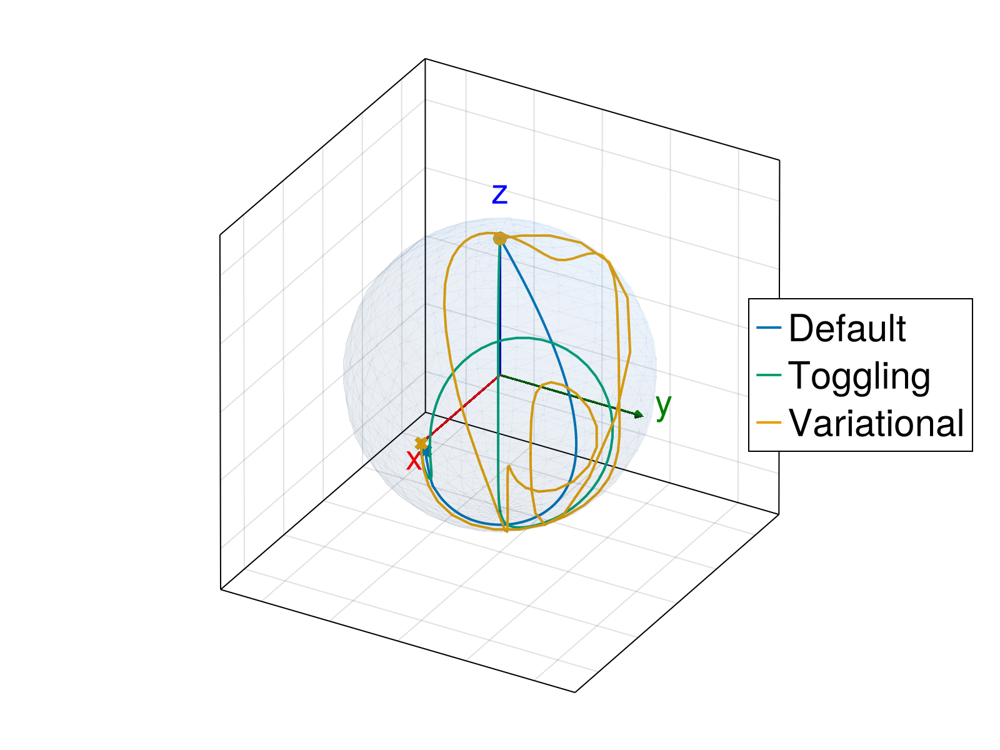

CairoMakie.Screen{IMAGE}


In [405]:
using GeometryBasics

default_traj = def.trajectory
tog_traj     = add_prob.trajectory
var_traj     = varadd_prob.trajectory

colors = [Makie.wong_colors()[1], Makie.wong_colors()[3], Makie.wong_colors()[2]]
ket_0 = [1.0, 0.0]
traj_vec = [default_traj, tog_traj, var_traj]
labels = ["Default", "Toggling", "Variational"]
rho_0 = ket_0 * ket_0'

f  = CairoMakie.Figure(resolution=(800, 600))
ax = CairoMakie.Axis3(f[1, 1]; aspect=:equal)

origins = [Point3f(0,0,0), Point3f(0,0,0), Point3f(0,0,0)]
dirs    = [Vec3f(1.0,0,0), Vec3f(0,1.0,0), Vec3f(0,0,1.0)]

CairoMakie.arrows!(ax, origins, dirs;
    color=[:red, :green, :blue], arrowsize=0.05, linewidth=0.01)

CairoMakie.text!(ax, "x", position=Point3f(1.2, 0, 0), align=(:left, :center),  color=:red,   fontsize=28)
CairoMakie.text!(ax, "y", position=Point3f(0, 1.2, 0), align=(:center, :bottom), color=:green, fontsize=28)
CairoMakie.text!(ax, "z", position=Point3f(0, 0, 1.2), align=(:center, :bottom), color=:blue,  fontsize=28)

for (i, traj) in enumerate(traj_vec)
    expect_val_x = [real(tr(PAULIS.X * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]
    expect_val_y = [real(tr(PAULIS.Y * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]
    expect_val_z = [real(tr(PAULIS.Z * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]

    CairoMakie.lines!(ax, real.(expect_val_x), real.(expect_val_y), real.(expect_val_z);
        color=colors[i], label=labels[i], linewidth=2.0)

    CairoMakie.scatter!(ax, [real(expect_val_x[end])], [real(expect_val_y[end])], [real(expect_val_z[end])];
        color=colors[i], markersize=15, marker=:xcross)
    CairoMakie.scatter!(ax, [real(expect_val_x[1])], [real(expect_val_y[1])], [real(expect_val_z[1])];
        color=colors[i], markersize=15)
end

CairoMakie.mesh!(ax, Sphere(Point3f(0,0,0), 1f0);
    color=(0.2, 0.6, 1.0, 0.05),
    transparency=true,
    shading=true
)

CairoMakie.xlims!(ax, -1.3, 1.3)
CairoMakie.ylims!(ax, -1.3, 1.3)
CairoMakie.zlims!(ax, -1.3, 1.3)

ax.azimuth[]   = π/6
ax.elevation[] = π/6

CairoMakie.hidexdecorations!(ax, grid=false)
CairoMakie.hideydecorations!(ax, grid=false)
CairoMakie.hidezdecorations!(ax, grid=false)

CairoMakie.axislegend(ax; position=:rc, labelsize=30)
display(f)

## 12. Save Controls & Metrics

Save optimized controls (one CSV per method) and robustness metrics for later replotting.

In [406]:
using DelimitedFiles

outdir = "no_Z_pulses"
mkpath(outdir)

# --- Save controls ---
A_default     = Matrix(def.trajectory.a)
A_toggling    = Matrix(add_prob.trajectory.a)
A_variational = Matrix(varadd_prob.trajectory.a)

function write_controls_csv(path::AbstractString, A::AbstractMatrix; dt_ns::Real=2.0)
    nch, nT = size(A)
    times = collect(0:dt_ns:dt_ns*(nT-1))

    labels = nch == 2 ? ["u_x", "u_y"] : ["u_x", "u_y", "u_z"]

    out = Matrix{Any}(undef, 1 + nch, 1 + nT)
    out[1, 1] = "time (ns)"
    out[1, 2:end] .= times
    for i in 1:nch
        out[1 + i, 1] = labels[i]
        out[1 + i, 2:end] .= vec(A[i, :])
    end

    writedlm(path, out, ',')
    return path
end

write_controls_csv(joinpath(outdir, "default.csv"),     A_default;     dt_ns=Δt)
write_controls_csv(joinpath(outdir, "toggling.csv"),    A_toggling;    dt_ns=Δt)
write_controls_csv(joinpath(outdir, "variational.csv"), A_variational; dt_ns=Δt)

println("Controls saved to: ", abspath(outdir))

# --- Save robustness metrics ---
H_err = PAULIS.Z
upsample_factor_save = 2^16

metrics = Matrix{Any}(undef, 4, 4)
metrics[1, :] = ["method", "var_obj", "tog_obj", "tog_obj_upsampled"]
for (row, label, traj) in [
    (2, "default",      def.trajectory),
    (3, "toggling",     add_prob.trajectory),
    (4, "variational",  varadd_prob.trajectory),
]
    metrics[row, 1] = label
    metrics[row, 2] = var_obj(traj, H_drive, [H_err])
    metrics[row, 3] = tog_obj(traj, H_drive, H_err)
    metrics[row, 4] = tog_obj_upsample(traj, H_drive, H_err; factor=upsample_factor_save)
end

writedlm(joinpath(outdir, "robustness_metrics.csv"), metrics, ',')
println("Metrics saved to: ", joinpath(abspath(outdir), "robustness_metrics.csv"))

# Print for verification
println()
println("=== Saved Metrics ===")
for r in 1:4
    println(join(metrics[r, :], "\t"))
end

## 13. Summary

**Cross-verification checks:**
1. Piccolo rollout ≈ QT unfiltered → propagation methods agree
2. QT filtered fidelity at ε=0 → gate survives the hardware filter
3. QT filtered fidelity vs ε → robustness is preserved after filtering
4. Robustness metrics (var_obj, tog_obj) confirm optimizer objectives